In [1]:
%matplotlib inline

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import os
from tqdm.auto import tqdm
import shutil
import random
import xml.etree.ElementTree as ET
from xml.dom import minidom
from pathlib import Path
import glob


import torch
import torchvision

from torch.utils.data import DataLoader
from torchvision import transforms, models, datasets, utils
from tqdm import tqdm

from sklearn.model_selection import train_test_split
import json

import torch.nn as nn
import torch.nn.functional as F

import torch.optim as optim
import sklearn.metrics as met
import scipy.io

random.seed(42)

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## Importing Dataset

In [3]:
!cp /content/gdrive/Shareddrives/BootCamp/Proyecto/dataset_YOLOV5.tar.gz .
!tar -xf /content/dataset_YOLOV5.tar.gz

In [4]:
!mv /content/content/dataset .
!rm -r /content/content

## Importing YOLOV5 Trained

In [5]:
!cp /content/gdrive/Shareddrives/BootCamp/Proyecto/yoloV5.tar.gz .
!tar -xf /content/yoloV5.tar.gz

In [6]:
!mv /content/content/yolov5 .
!rm -r /content/content
!rm /content/yoloV5.tar.gz

## Sample Result

In [8]:
!pip install -r /content/yolov5/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [9]:
!rm -r /content/yolov5/runs/detect/exp

rm: cannot remove '/content/yolov5/runs/detect/exp': No such file or directory


In [10]:
%cd /content/yolov5/
!python detect.py --weights /content/yolov5/runs/train/yolov5s_results/weights/best.pt --img 1000 --conf 0.5 --source /content/dataset/test/images

/content/yolov5
detect: weights=['/content/yolov5/runs/train/yolov5s_results/weights/best.pt'], source=/content/dataset/test/images, data=data/coco128.yaml, imgsz=[1000, 1000], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-294-g574ceed Python-3.7.13 torch-1.11.0+cu102 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7257306 parameters, 0 gradients, 16.8 GFLOPs
image 1/10 /content/dataset/test/images/disk-031.png: 1024x1024 3 Dyskeratotics, Done. (0.014s)
image 2/10 /content/dataset/test/images/disk-060.png: 1024x1024 1 Dyskeratotic, Done. (0.014s)
image 3/10 /content/dataset/test/images/disk-064.png: 1024x1024 1 Dyskeratotic, Done. (0.014s)

Image: /content/yolov5/runs/detect/exp/disk-064.png


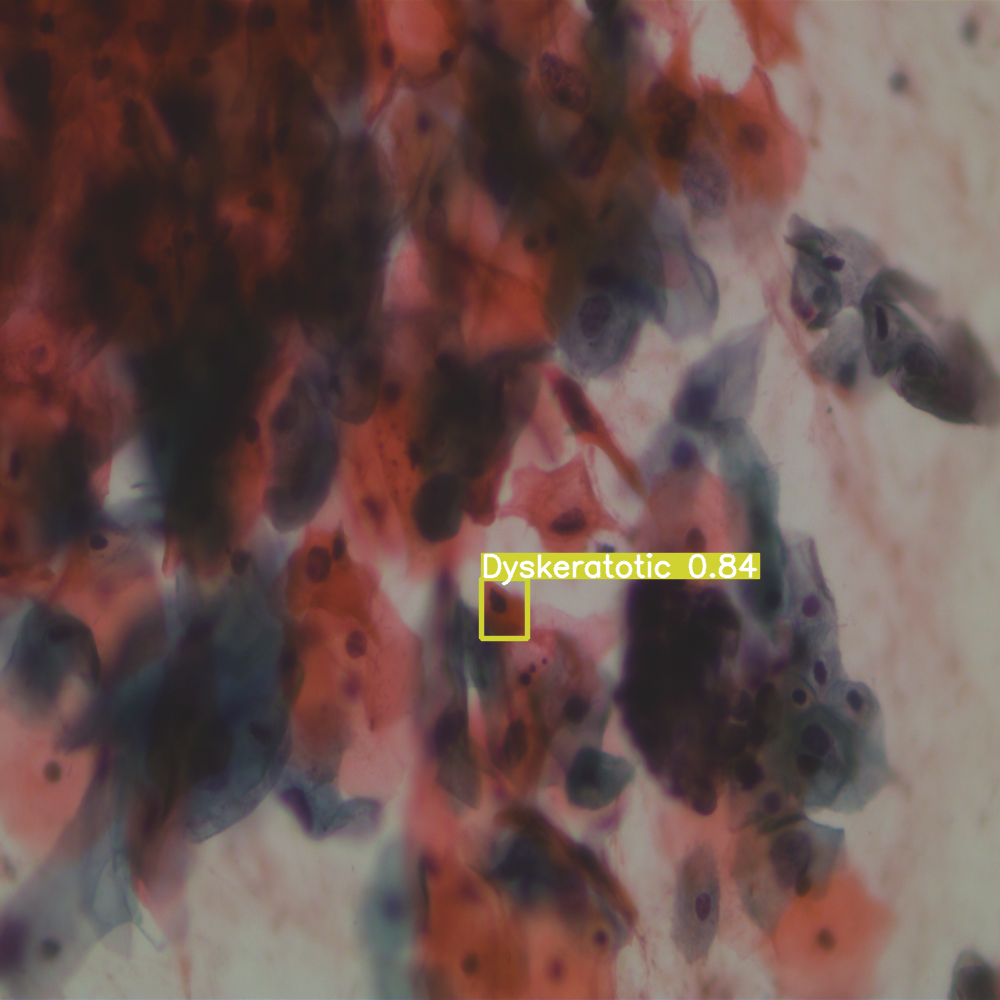



Image: /content/yolov5/runs/detect/exp/sup_int-113.png


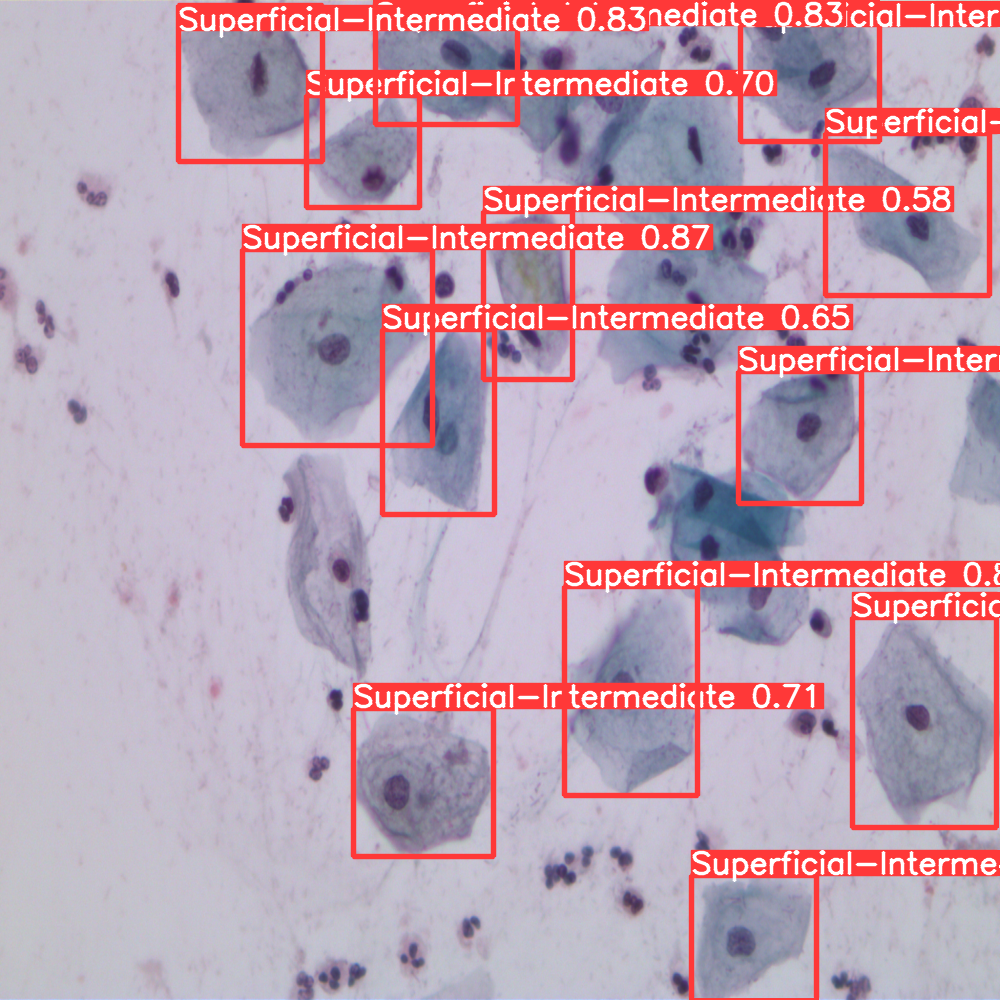



Image: /content/yolov5/runs/detect/exp/disk-060.png


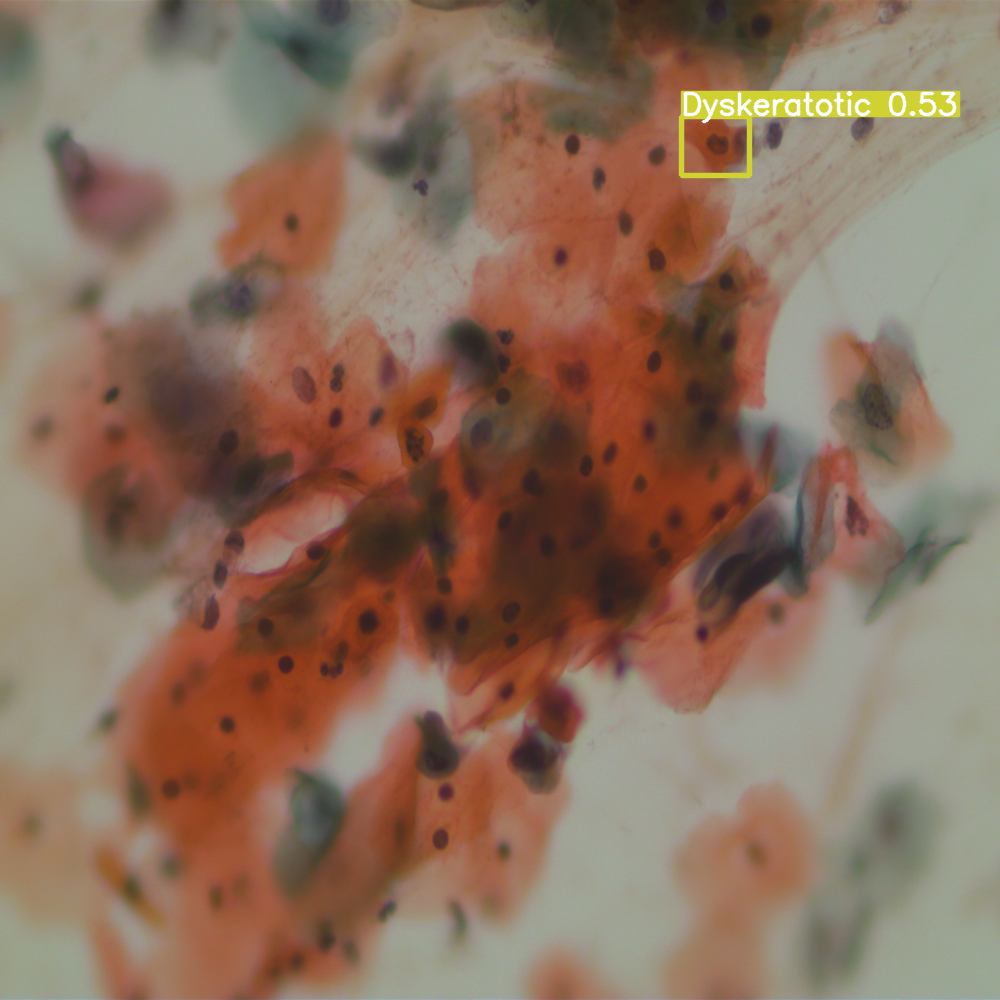



Image: /content/yolov5/runs/detect/exp/disk-121.png


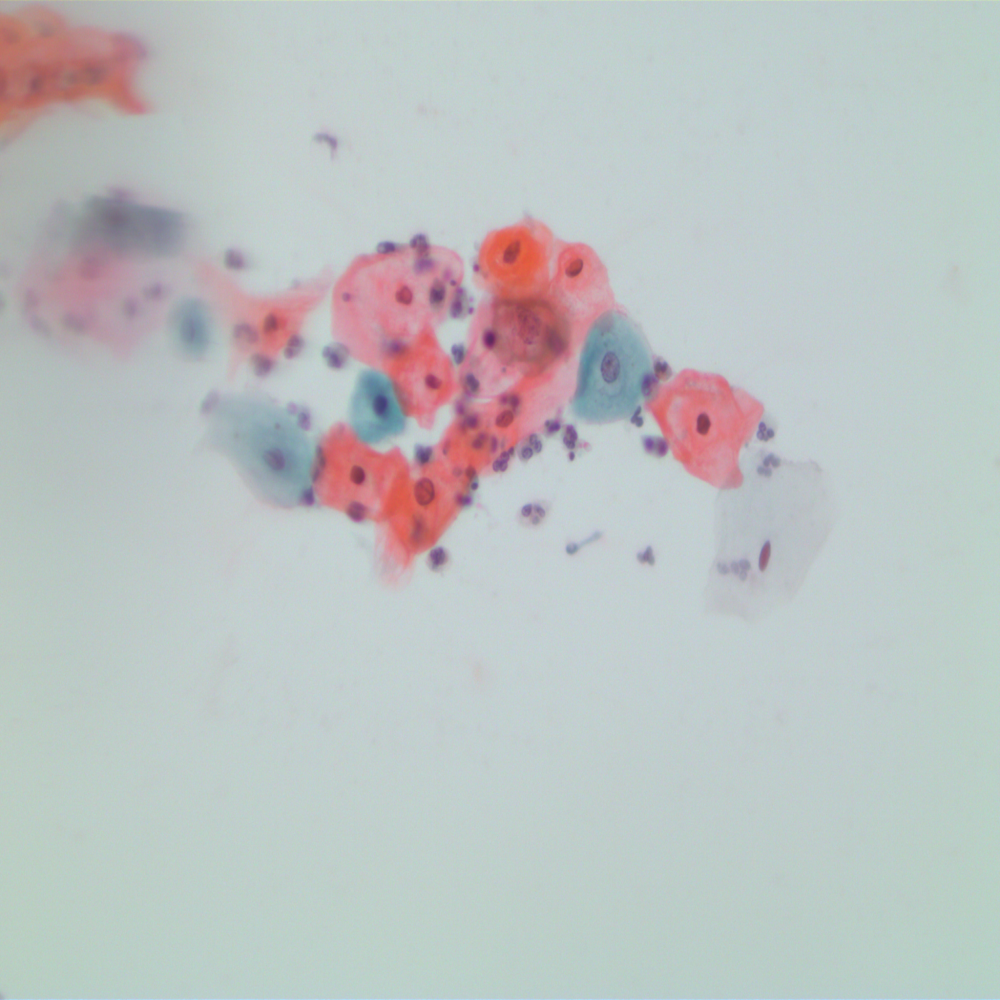



Image: /content/yolov5/runs/detect/exp/sup_int-003.png


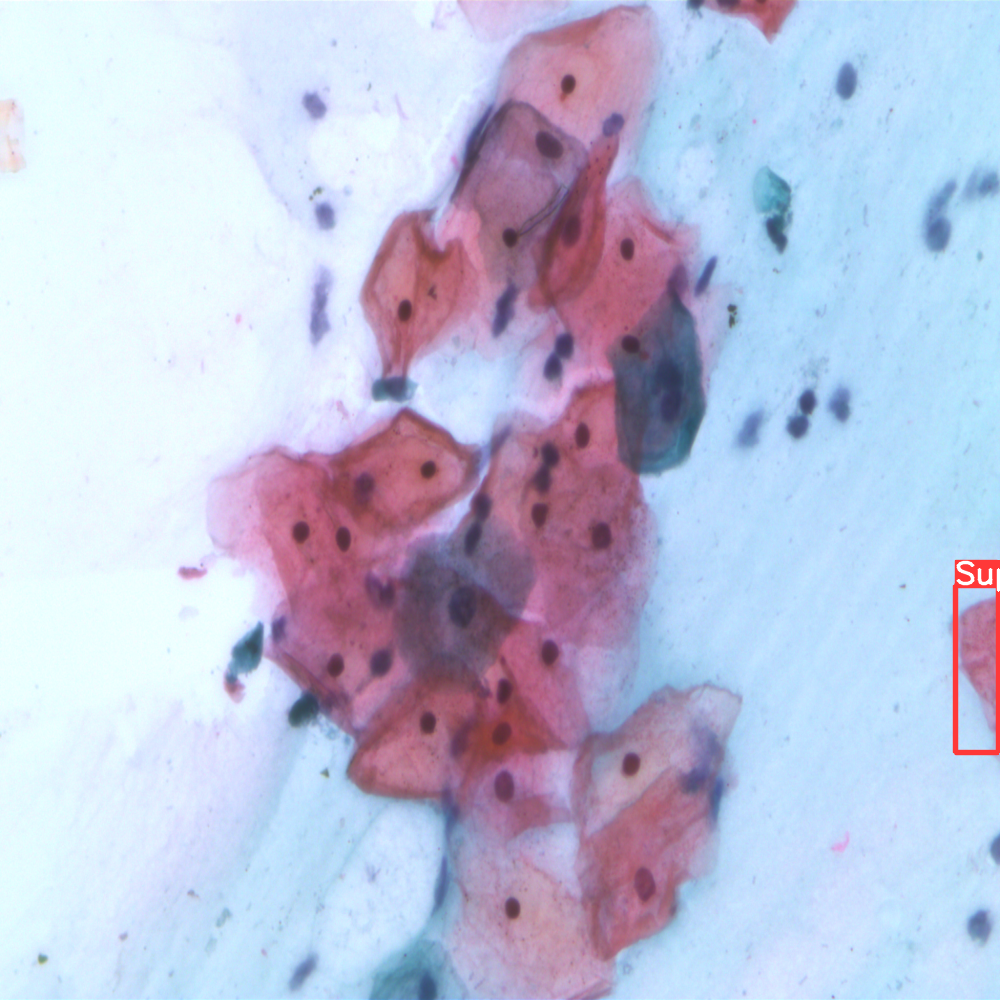



Image: /content/yolov5/runs/detect/exp/disk-111.png


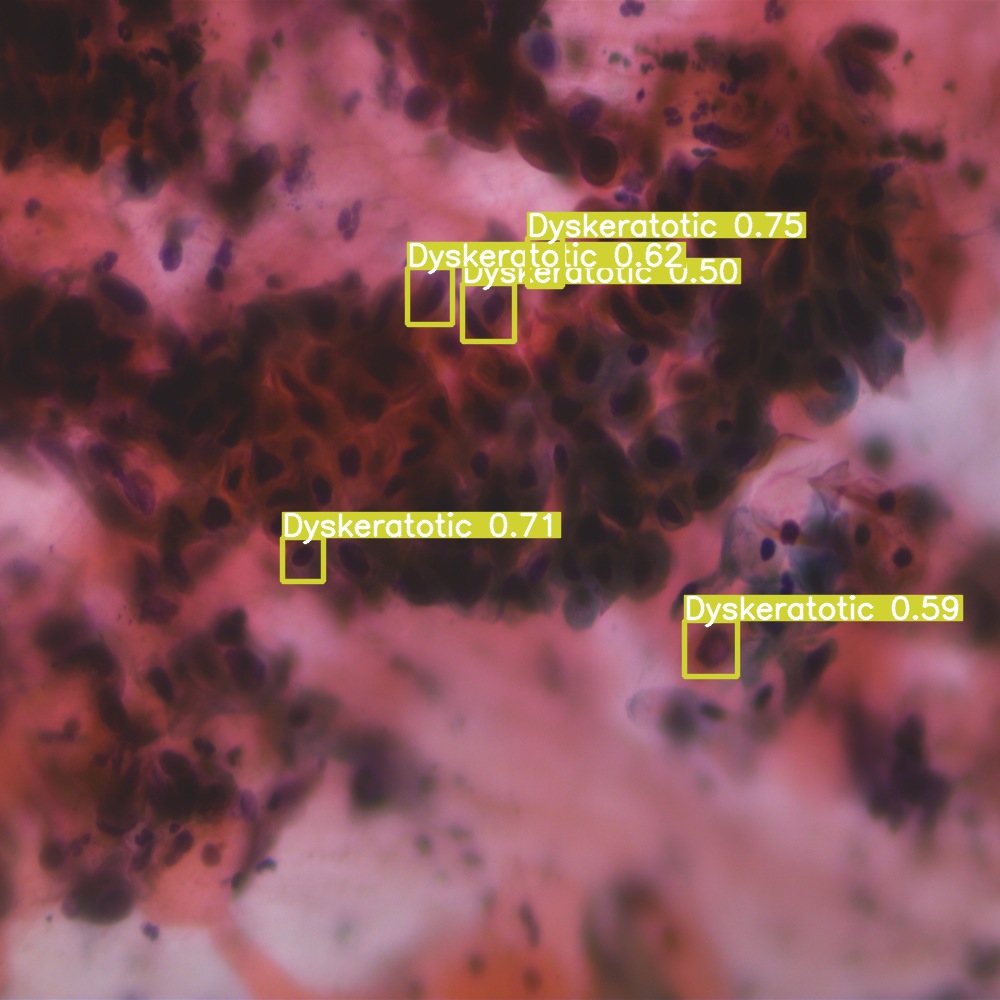



Image: /content/yolov5/runs/detect/exp/sup_int-022.png


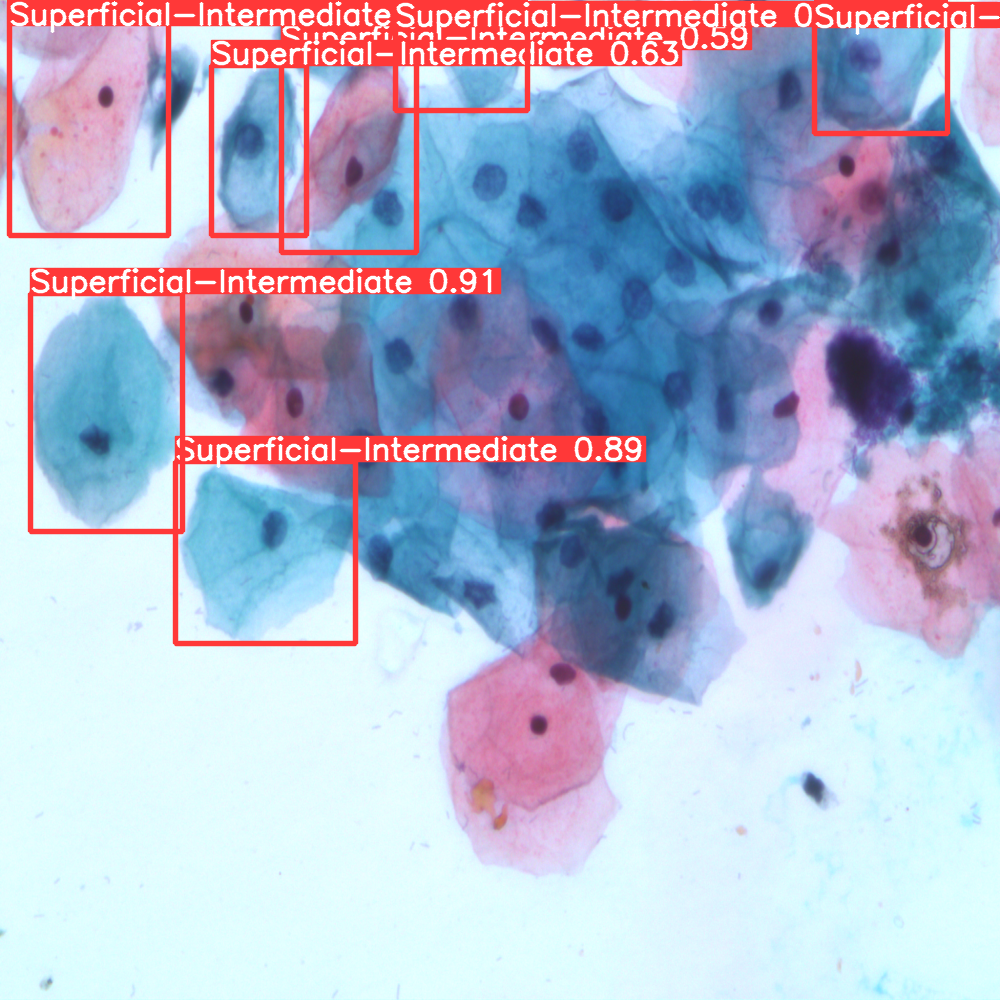



Image: /content/yolov5/runs/detect/exp/disk-031.png


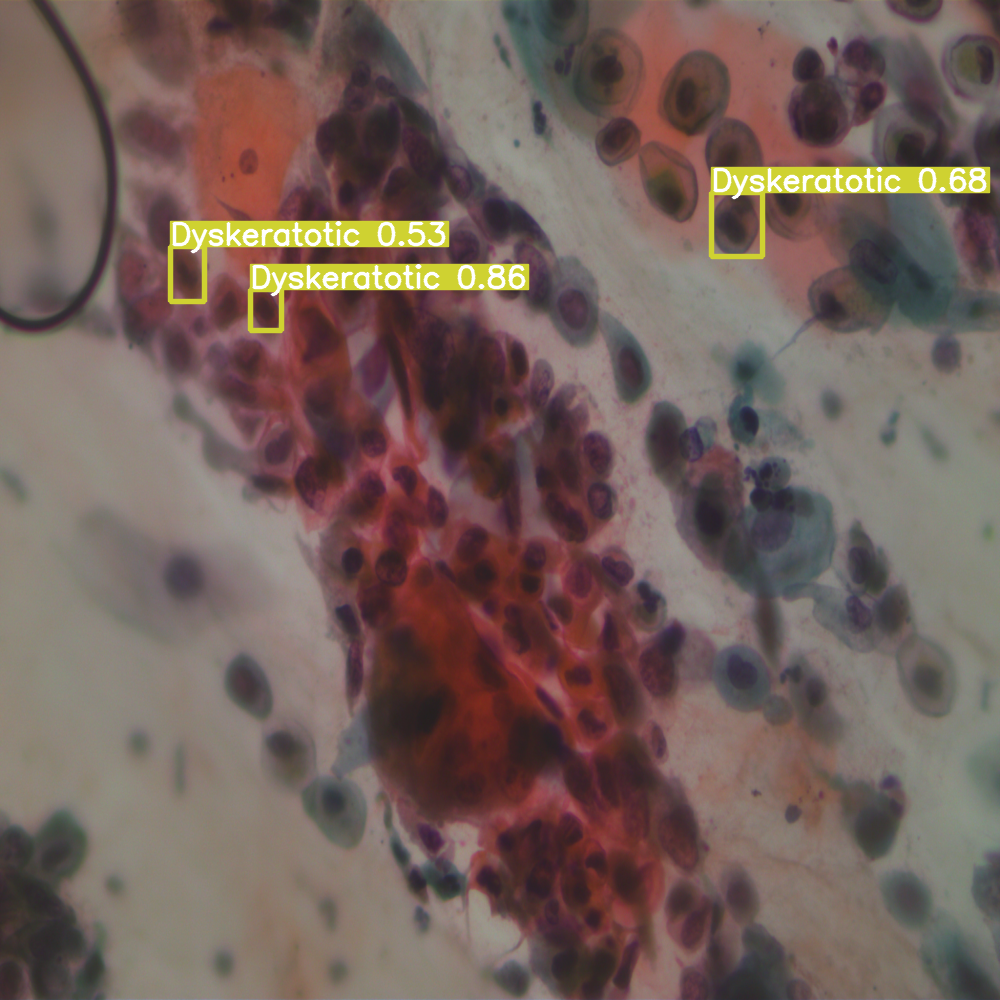



Image: /content/yolov5/runs/detect/exp/meta-021.png


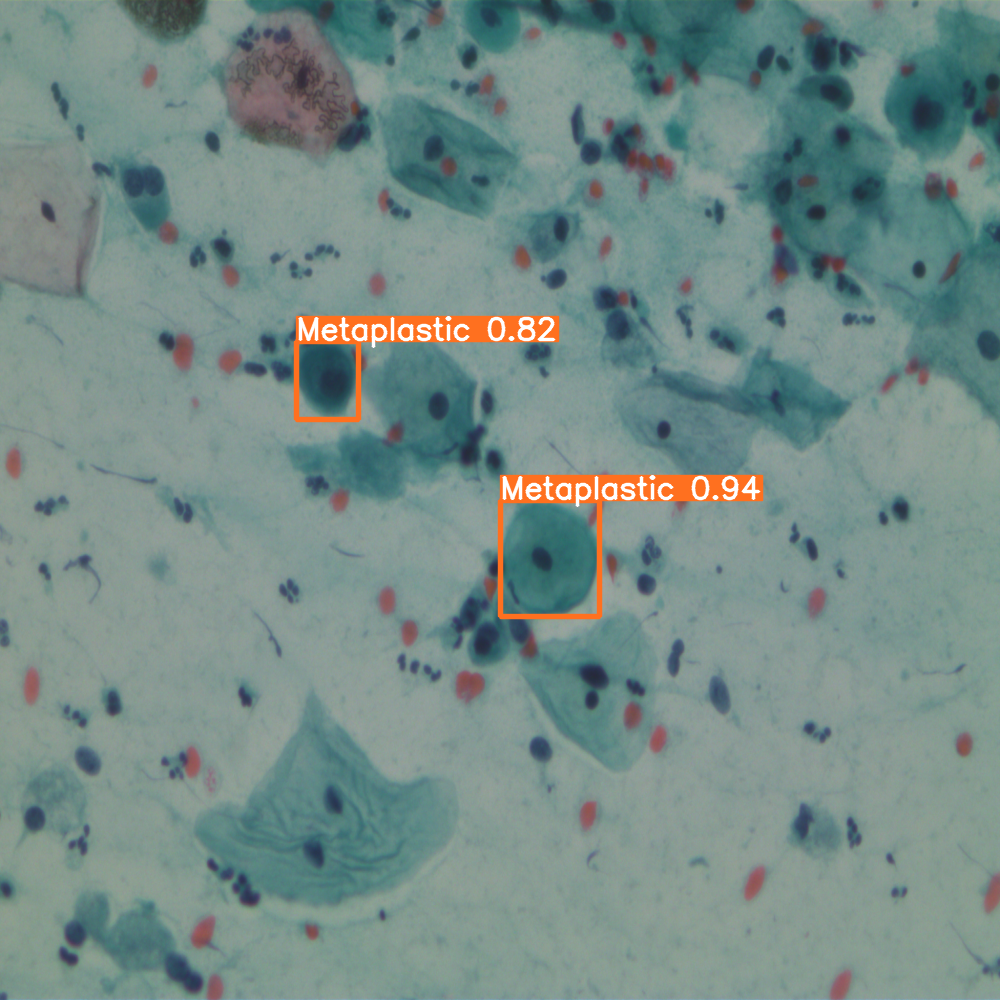



Image: /content/yolov5/runs/detect/exp/disk-200.png


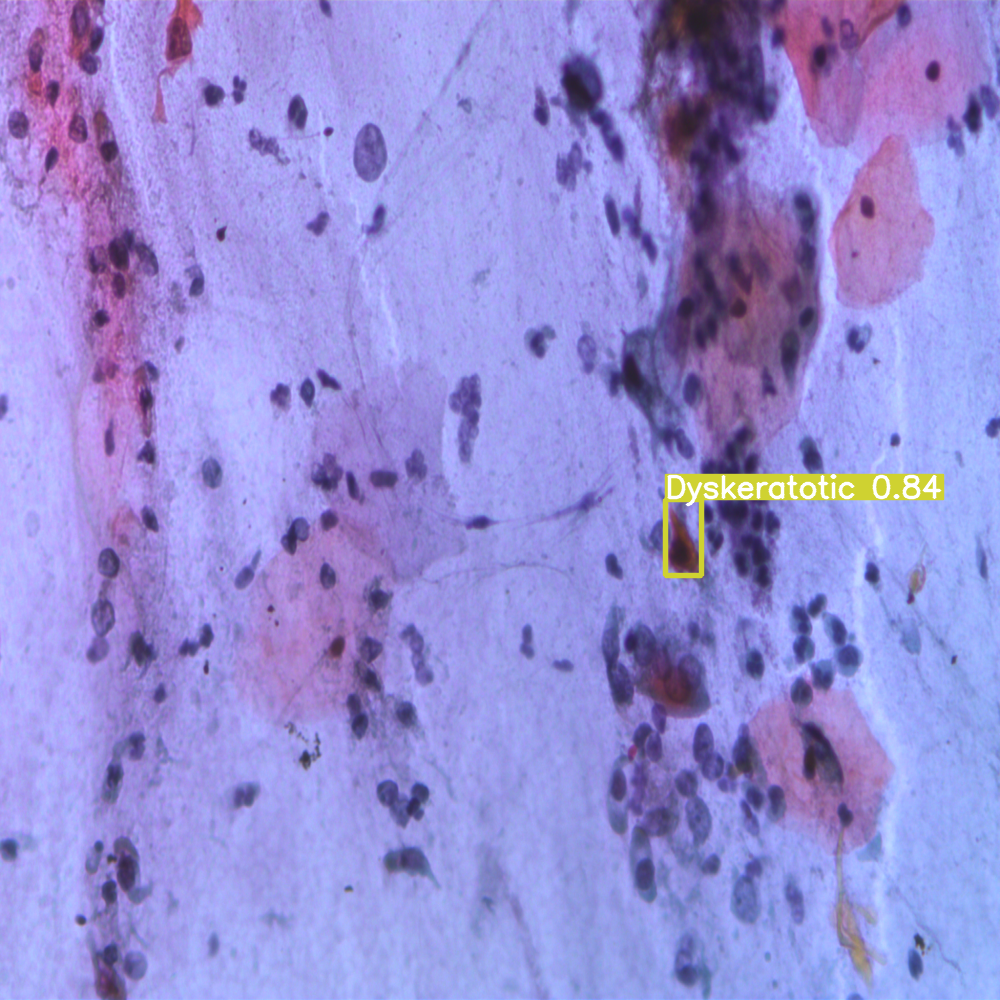

In [11]:
import glob
from IPython.display import Image, display

for image in glob.glob('/content/yolov5/runs/detect/exp/*.png'):
    print('Image: {}'.format(image))
    display(Image(filename=image))
    print("\n")

## Showing Metrics

### Confussion Matrix

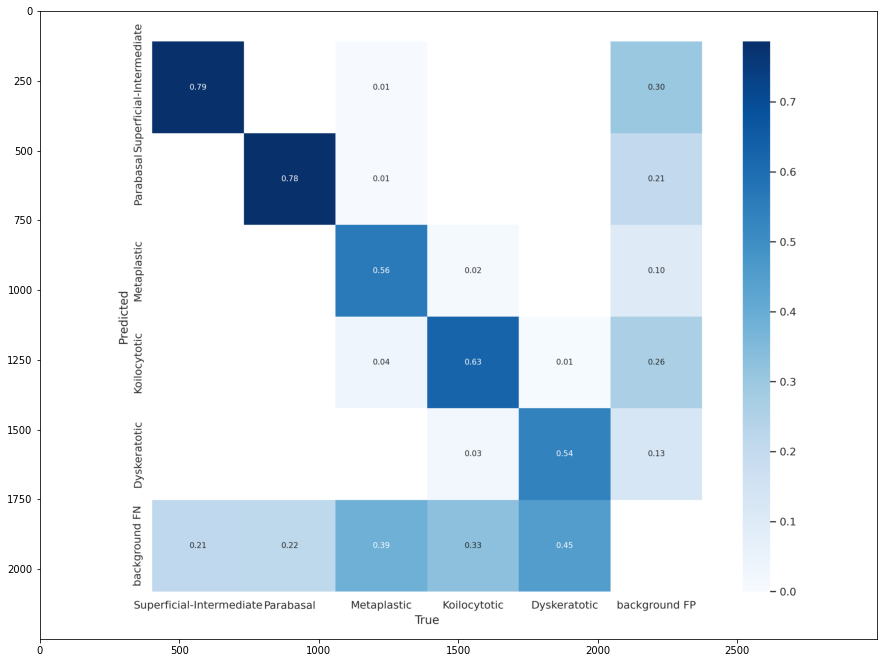

In [12]:
img = mpimg.imread('/content/yolov5/runs/train/yolov5s_results/confusion_matrix.png')
plt.figure(figsize = (15,15))
plt.imshow(img)

### F1 Scores

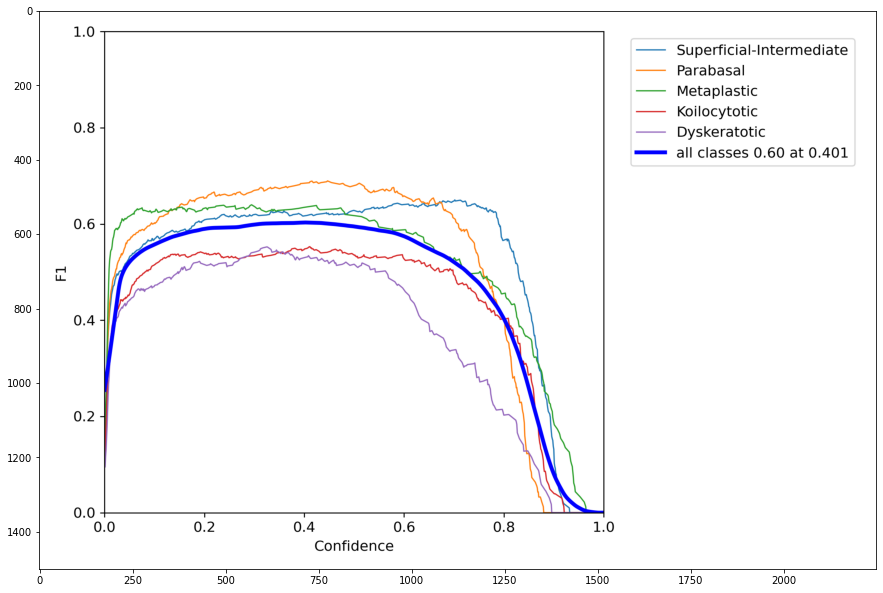

In [13]:
img = mpimg.imread('/content/yolov5/runs/train/yolov5s_results/F1_curve.png')
plt.figure(figsize = (15,15))
plt.imshow(img)

### Precision 

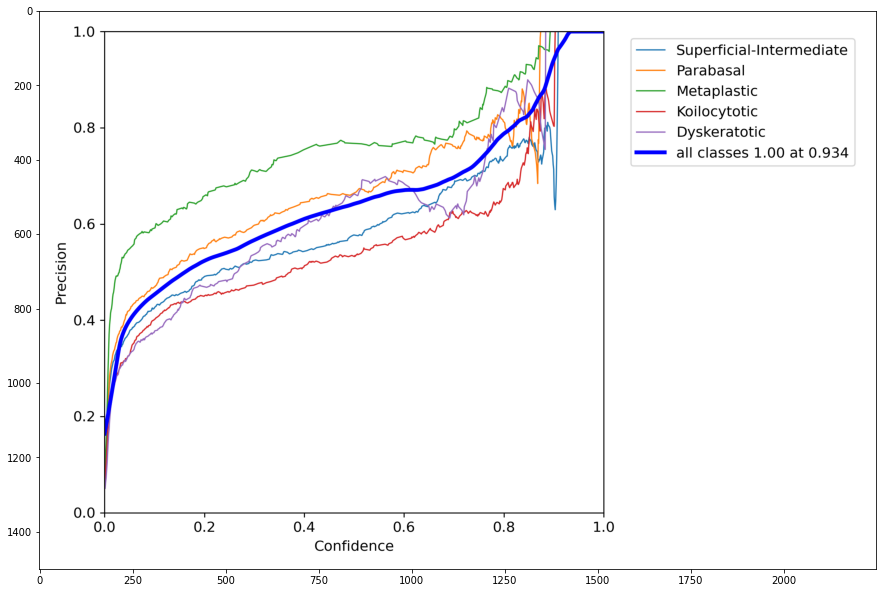

In [14]:
img = mpimg.imread('/content/yolov5/runs/train/yolov5s_results/P_curve.png')
plt.figure(figsize = (15,15))
plt.imshow(img)

### Recall

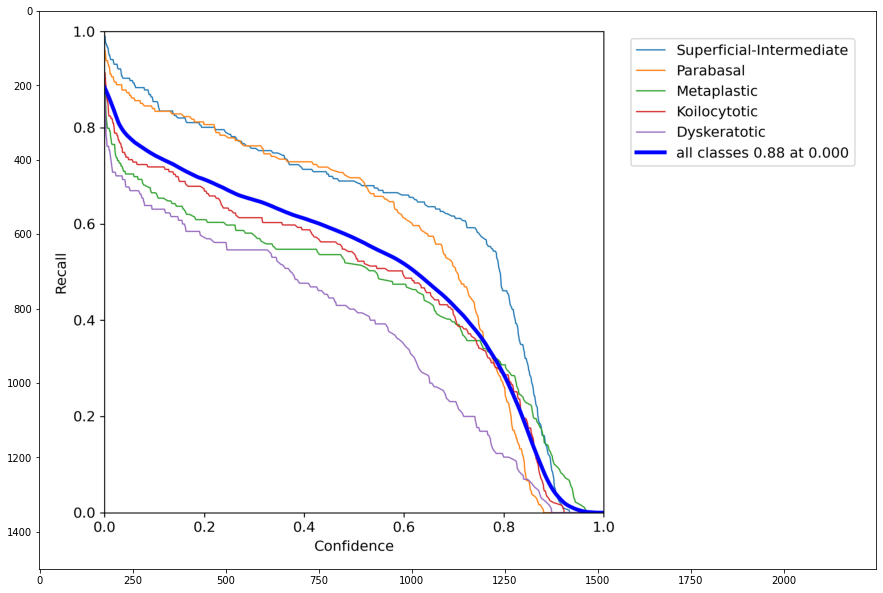

In [15]:
img = mpimg.imread('/content/yolov5/runs/train/yolov5s_results/R_curve.png')
plt.figure(figsize = (15,15))
plt.imshow(img)

### Precision & Recall 

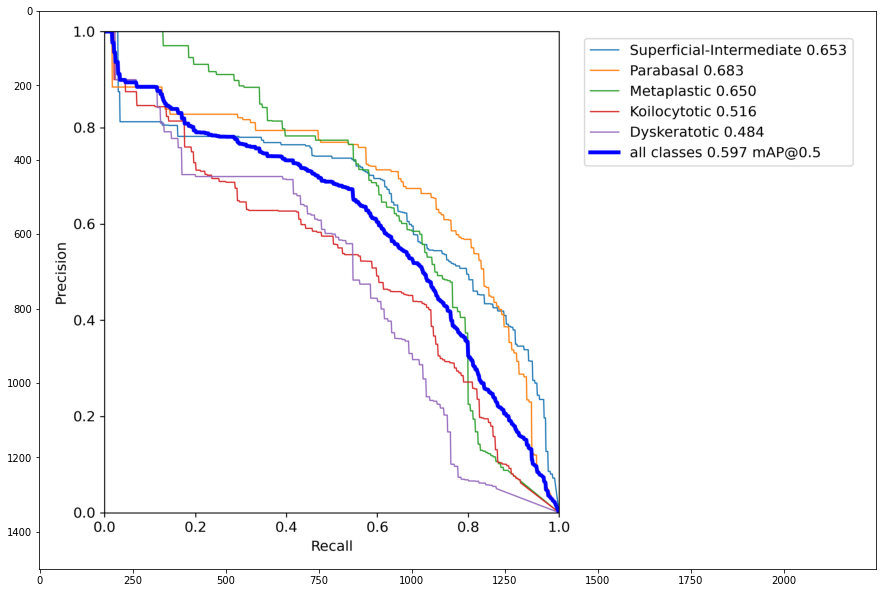

In [16]:
img = mpimg.imread('/content/yolov5/runs/train/yolov5s_results/PR_curve.png')
plt.figure(figsize = (15,15))
plt.imshow(img)

### Composition of the Data

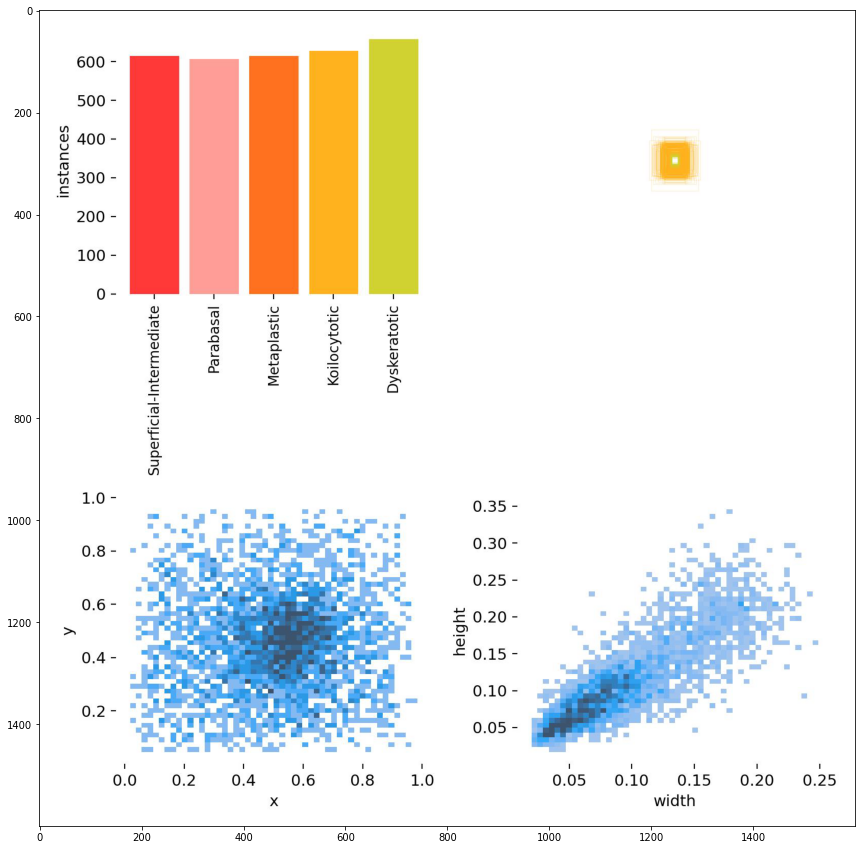

In [17]:
img = mpimg.imread('/content/yolov5/runs/train/yolov5s_results/labels.jpg')
plt.figure(figsize = (15,15))
plt.imshow(img)

## Exporting Model to TensorflowJS

In [18]:
!rm -r /content/yolov5/runs/train/yolov5s_results/weights/best_saved_model 
!rm -r /content/yolov5/runs/train/yolov5s_results/weights/best_web_model
!rm /content/yolov5/runs/train/yolov5s_results/weights/best.pb

rm: cannot remove '/content/yolov5/runs/train/yolov5s_results/weights/best_saved_model': No such file or directory
rm: cannot remove '/content/yolov5/runs/train/yolov5s_results/weights/best_web_model': No such file or directory
rm: cannot remove '/content/yolov5/runs/train/yolov5s_results/weights/best.pb': No such file or directory


In [20]:
!pip install tensorflowjs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [21]:
%cd /content/yolov5
!python export.py --weights runs/train/yolov5s_results/weights/best.pt --include tfjs

/content/yolov5
export: data=data/coco128.yaml, weights=['runs/train/yolov5s_results/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, train=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=12, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['tfjs']
YOLOv5 🚀 v6.1-294-g574ceed Python-3.7.13 torch-1.11.0+cu102 CPU

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7257306 parameters, 0 gradients, 16.8 GFLOPs

PyTorch: starting from runs/train/yolov5s_results/weights/best.pt with output shape (1, 25200, 10) (14.6 MB)

TensorFlow SavedModel: starting export with tensorflow 2.8.2...

                 from  n    params  module                                  arguments                     
  0                -1  1      3520  models.common.Focus                     [3, 32, 3]                    
2022-07-13 23:58:50.004227: E ten

In [ ]:
%cd /content/
!tar -czvf yoloV5TFJS.tar.gz /content/yolov5/runs/train/yolov5s_results/weights/best_web_model

/content
tar: Removing leading `/' from member names
/content/yolov5/runs/train/yolov5s_results/weights/best_web_model/
/content/yolov5/runs/train/yolov5s_results/weights/best_web_model/group1-shard1of7.bin
/content/yolov5/runs/train/yolov5s_results/weights/best_web_model/group1-shard2of7.bin
/content/yolov5/runs/train/yolov5s_results/weights/best_web_model/group1-shard7of7.bin
/content/yolov5/runs/train/yolov5s_results/weights/best_web_model/group1-shard5of7.bin
/content/yolov5/runs/train/yolov5s_results/weights/best_web_model/group1-shard4of7.bin
/content/yolov5/runs/train/yolov5s_results/weights/best_web_model/group1-shard6of7.bin
/content/yolov5/runs/train/yolov5s_results/weights/best_web_model/model.json
/content/yolov5/runs/train/yolov5s_results/weights/best_web_model/group1-shard3of7.bin


In [ ]:
!cp /content/yoloV5TFJS.tar.gz /content/gdrive/Shareddrives/BootCamp/Proyecto